In [30]:
import heist
import helpers
import torch.distributions
import torch

import gym
import random
import numpy as np
from helpers import generate_action, load_model
from procgen import ProcgenGym3Env
import imageio
import matplotlib.pyplot as plt
import typing
import math
from IPython.display import Image, display


from procgen import ProcgenGym3Env
import struct
import typing
from typing import Tuple, Dict, Callable, List, Optional
from dataclasses import dataclass
from src.policies_modified import ImpalaCNN
from procgen_tools.procgen_wrappers import VecExtractDictObs, TransposeFrame, ScaledFloatFrame

from gym3 import ToBaselinesVecEnv

%load_ext autoreload
%autoreload 2

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [89]:
def create_gem_states(num_samples=5, num_levels=100):
    observations_list = []

    for _ in range(num_samples):
        venv = heist.create_venv(num=1, start_level=random.randint(1000, 10000), num_levels=num_levels)
        state = heist.state_from_venv(venv, 0)
        full_grid = state.full_grid(with_mouse=False)
        entities = state.state_vals["ents"]
        legal_mouse_positions = heist.get_legal_mouse_positions(full_grid, entities)

        state.remove_all_entities()

        # Add player to the environment
        player_pos = legal_mouse_positions[random.randint(0, len(legal_mouse_positions) - 1)]
        state.set_mouse_pos(*player_pos)

        # Add gem to the environment
        gem_pos = legal_mouse_positions[random.randint(0, len(legal_mouse_positions) - 1)]
        state.set_gem_position(*gem_pos)

        state_bytes = state.state_bytes
        if state_bytes is not None:
            venv.env.callmethod("set_state", [state_bytes])
            obs = venv.reset()
            observations_list.append(obs[0])

        venv.close()

    return venv

def create_key_states(key_color_combinations, num_samples=5, num_levels=100):
    venvs_list = []
    key_indices = {"blue": 0, "green": 1, "red": 2}

    sample_idx = 0
    while sample_idx < num_samples:
        venv = heist.create_venv(num=1, start_level=random.randint(1000, 10000), num_levels=num_levels)
        state = heist.state_from_venv(venv, 0)

        if not all(color in state.get_key_colors() for color in ['blue', 'green', 'red']):
            venv.close()
            continue
        


        for key_colors in key_color_combinations:
            state.remove_all_entities()
            full_grid = state.full_grid(with_mouse=False)
            entities = state.state_vals["ents"]
            legal_mouse_positions = heist.get_legal_mouse_positions(full_grid, entities)

            for i, color in enumerate(key_colors):
                key_index = key_indices[color]
                x, y = legal_mouse_positions[random.randint(0, len(legal_mouse_positions) - 1)]
                state.set_key_position(key_index, x, y)

            full_grid = state.full_grid(with_mouse=False)
            entities = state.state_vals["ents"]
            legal_mouse_positions = heist.get_legal_mouse_positions(full_grid, entities)
            player_pos = legal_mouse_positions[random.randint(0, len(legal_mouse_positions) - 1)]
            state.set_mouse_pos(*player_pos)
            state_bytes = state.state_bytes
            if state_bytes is not None:
                        # Add player to the environment
                venv.env.callmethod("set_state", [state_bytes])
                venvs_list.append(venv)

        venv.close()
        sample_idx += 1

    return venvs_list

def run_episode_and_save_as_gif(env, model, filepath='../gifs/run.gif', save_gif=False, episode_timeout=200):

    observations = []
    observation = env.reset()
    done = False
    total_reward = 0
    frames=[]
    

    # observation = colour_swap(observation)
    count = 0
    while not done:
        if save_gif:
            frames.append(env.render(mode='rgb_array')) 
        print(observation.shape) 
        action = generate_action(model, observation[0], is_procgen_env=True) 
        print(action)
        
        observation, reward, done, info = env.step(action)
        total_reward += reward
        observations.append(observation)
        count +=1
        if count >= episode_timeout:
            break

    if save_gif:
        imageio.mimsave(filepath, frames, fps=30) 

    return total_reward, frames, observations



In [37]:
model = load_model()

/Users/paul/anaconda3/envs/procgen/lib/python3.8/site-packages/gym/utils/passive_env_checker.py:174: UserWarning: WARN: Future gym versions will require that `Env.reset` can be passed a `seed` instead of using `Env.seed` for resetting the environment random number generator.
  logger.warn(
/Users/paul/anaconda3/envs/procgen/lib/python3.8/site-packages/gym/utils/passive_env_checker.py:187: UserWarning: WARN: Future gym versions will require that `Env.reset` can be passed `options` to allow the environment initialisation to be passed additional information.
  logger.warn(
/Users/paul/anaconda3/envs/procgen/lib/python3.8/site-packages/gym/utils/passive_env_checker.py:195: UserWarning: WARN: The result returned by `env.reset()` was not a tuple of the form `(obs, info)`, where `obs` is a observation and `info` is a dictionary containing additional information. Actual type: `<class 'numpy.ndarray'>`
  logger.warn(


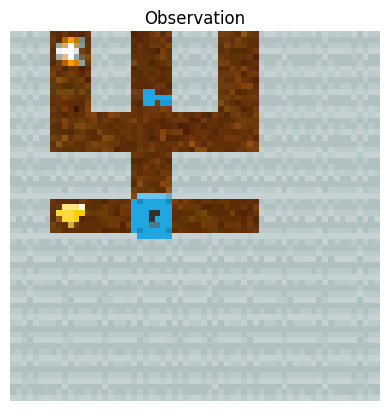

/Users/paul/anaconda3/envs/procgen/lib/python3.8/site-packages/gym/utils/passive_env_checker.py:272: UserWarning: WARN: No render modes was declared in the environment (env.metadata['render_modes'] is None or not defined), you may have trouble when calling `.render()`.
  logger.warn(
/Users/paul/anaconda3/envs/procgen/lib/python3.8/site-packages/gym/utils/passive_env_checker.py:219: DeprecationWarning: WARN: Core environment is written in old step API which returns one bool instead of two. It is recommended to rewrite the environment with new step API. 
  logger.deprecation(
/Users/paul/anaconda3/envs/procgen/lib/python3.8/site-packages/gym/utils/passive_env_checker.py:225: DeprecationWarning: `np.bool8` is a deprecated alias for `np.bool_`.  (Deprecated NumPy 1.24)
  if not isinstance(done, (bool, np.bool8)):


Episode finished with total reward: 10.0


In [87]:
# Create environment and load model

env_name = "procgen:procgen-heist-v0"  
env = gym.make(env_name, start_level=100, num_levels=200, render_mode="rgb_array", distribution_mode="easy") #remove render mode argument to go faster but not produce images 
obs = env.reset()
# Transpose the data to (height, width, channels)
helpers.plot_single_observation(obs)

total_reward, frames, observations = heist.run_episode_and_save_as_gif(env, model, filepath=f'episode.gif', save_gif=True)
print(f"Episode finished with total reward: {total_reward}")

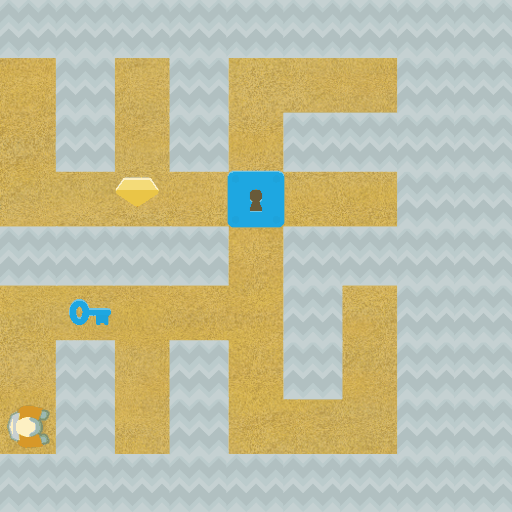

In [69]:
# Display an image file from local storage
display(Image(filename='episode.gif'))

In [34]:
# Creating custom envs!

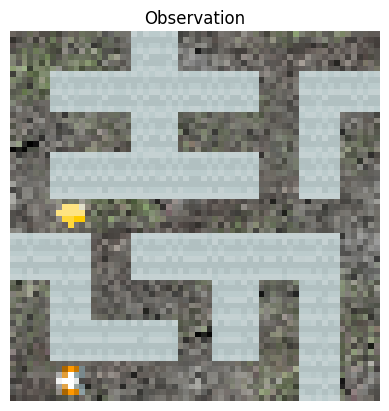

In [70]:
venv = create_gem_states(num_samples=1, num_levels=100)
# key_color_combinations = [['blue'], ['green'], ['blue', 'green']]
# key_color_combinations = [['blue']]
# venvs_list = create_key_states(key_color_combinations, 1, 100)

obs = venv.reset()[0]
obs = obs.transpose((1,2,0))
# Transpose the data to (height, width, channels)
helpers.plot_single_observation(obs)

In [90]:
run_episode_and_save_as_gif(venv, model)

(1, 3, 64, 64)


RuntimeError: Given groups=1, weight of size [16, 3, 3, 3], expected input[1, 64, 3, 64] to have 3 channels, but got 64 channels instead

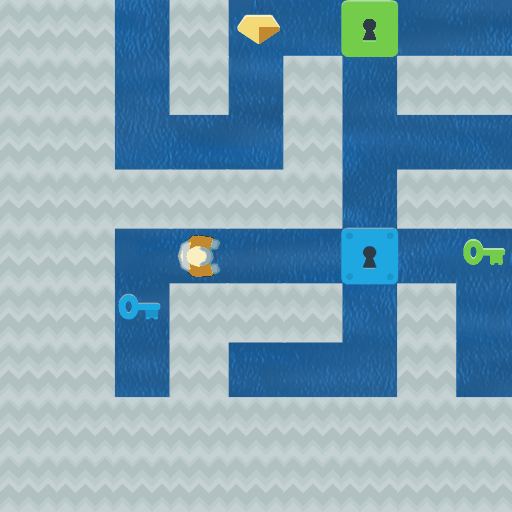